# Gaussian Processes in Julia with Stheno

In [ ]:
# Theoretical background to go here (and probs for parts of the content)

In [1]:
using Pkg
Pkg.add("Stheno")

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  100.0 %.0 % Resolving package versions...
 Installed BlockArrays ─ v0.10.2
 Installed Stheno ────── v0.5.0
  Updating `~/.julia/environments/v1.2/Project.toml`
  [8188c328] + Stheno v0.5.0
  Updating `~/.julia/environments/v1.2/Manifest.toml`
  [8e7c35d0] + BlockArrays v0.10.2
  [8188c328] + Stheno v0.5.0


In [22]:
Pkg.add("AdvancedHMC")

 Resolving package versions...
  Updating `~/.julia/environments/v1.2/Project.toml`
  [0bf59076] + AdvancedHMC v0.2.20
  Updating `~/.julia/environments/v1.2/Manifest.toml`
 [no changes]


In [2]:
using Stheno, Plots, Optim

┌ Info: Precompiling Stheno [8188c328-b5d6-583d-959b-9690869a5511]
└ @ Base loading.jl:1242


## 1. Construct a first Gaussian process

In [5]:
# Choose the length-scale and variance of the process
l = 0.4
σ² = 1.3;

In [7]:
# Construct a kernel
k = σ² * stretch(matern52(), 1 / l)

# Construct a zero-mean GP with the kernel
f = GP(k, GPC());

In [9]:
# Generate a sample from the GP
const x = randn(100)
σ²_n = 0.05
fx = f(x, σ²_n)
const y = rand(fx);

In [10]:
# Compute the log marginal likelihood for this observation
logpdf(fx, y)

-29.12818815349201

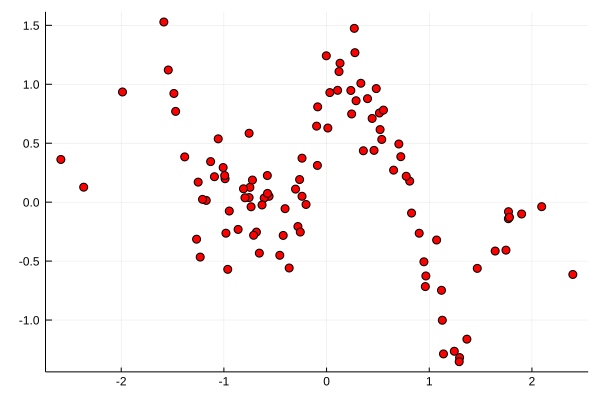

In [11]:
# Visualize the GP
using Plots

plt = plot()
scatter!(plt, x, y; color=:red, label="")

In [13]:
# Compute the posterior over f
f_posterior = f | Obs(fx, y);

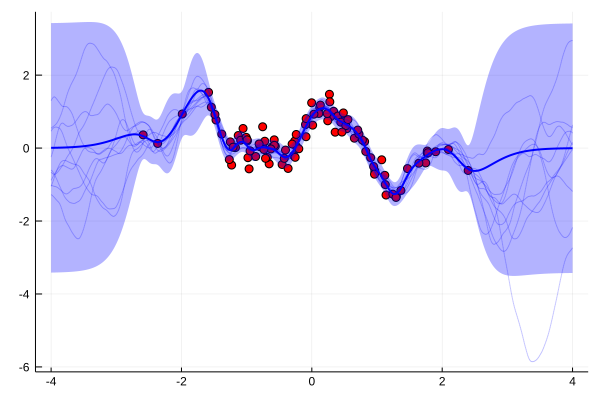

In [14]:
# Visualize the posterior
x_plot = range(-4.0, 4.0; length=1000)
plot!(plt, f_posterior(x_plot); samples=10, label="", color=:blue)

## 2. GP regression using Stheno's low-level API

In [15]:
# -- explanation to go here --
function unpack(θ)
    σ² = exp(θ[1]) + 1e-6
    l = exp(θ[2]) + 1e06
    σ²_n = exp(θ[3]) + 1e-6
    return σ²,l, σ²_n
end

# negative log marginal likelihood of θ
function nlml(θ)
    σ², l, σ²_n = unpack(θ)
    k = σ² * stretch(matern52(), 1 / l)
    f = GP(k, GPC())
    return -logpdf(f(x, σ²_n), y)
end

nlml (generic function with 1 method)

In [18]:
using Optim

θ0 = randn(3)
results = Optim.optimize(nlml, θ0, NelderMead())
σ²_ml, l_ml, σ²_n_ml = unpack(results.minimizer)

(0.016270562213284333, 1.303390261150631e236, 0.393221144534431)

In [19]:
# Construct the posterior GP - not working right now?
k = σ²_ml * stretch(matern52(), 1 / l_ml)
f = GP(k, GPC())
f_posterior_ml = f | Obs(f(x, σ²_n_ml), y)
plot!(plt, f_posterior_ml(x_plot); samples=10, color=:green, label="")

## 3. GP fitting with BFGS using Zygote.jl

In [20]:
using Zygote: gradient

# Set up the optimization
θ0 = randn(3)
results = Optim.optimize(nlml, θ->gradient(nlml, θ)[1], θ0, BFGS(); inplace=false)
σ²_bfgs, l_bfgs, σ²_n_bfgs = unpack(results.minimizer);

In [21]:
k = σ²_bfgs * stretch(matern52(), 1 / l_bfgs)
f = GP(k, GPC())
f_posterior_bfgs = f | Obs(f(x, σ²_n_bfgs), y)
plot!(plt, f_posterior_bfgs(x_plot); samples=10, color=:purple, label="")

## 4. Approximate Bayesian inference of the GP's hyperparameters

In [23]:
using AdvancedHMC, Zygote

In [ ]:
# Define the log marginal likelihood function and its gradient
lπ(θ) = -nlml(θ)
